# **Food Business Data Analysis 🛒**

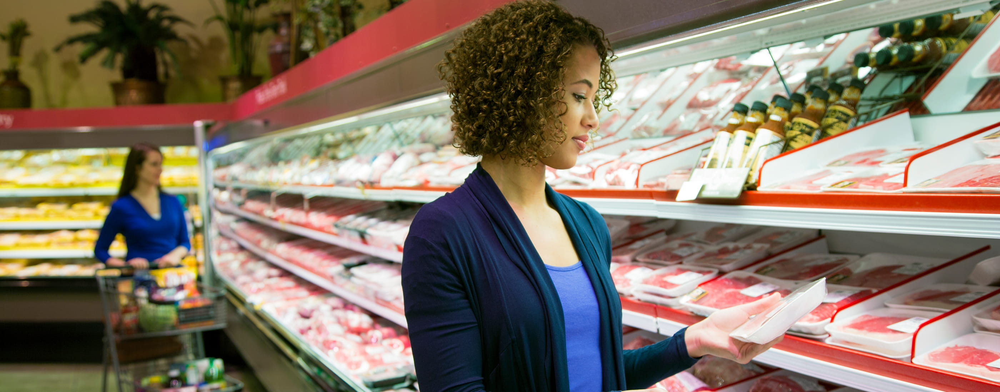

## **1. Import libraries 📚**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sns
import numpy as np

## **2. Load data ⬆️**

https://www.kaggle.com/datasets/jackdaoud/marketing-data/data

In [ ]:
df = pd.read_csv('ifood_df.csv')

## **3. Data Libraries 🗃️**

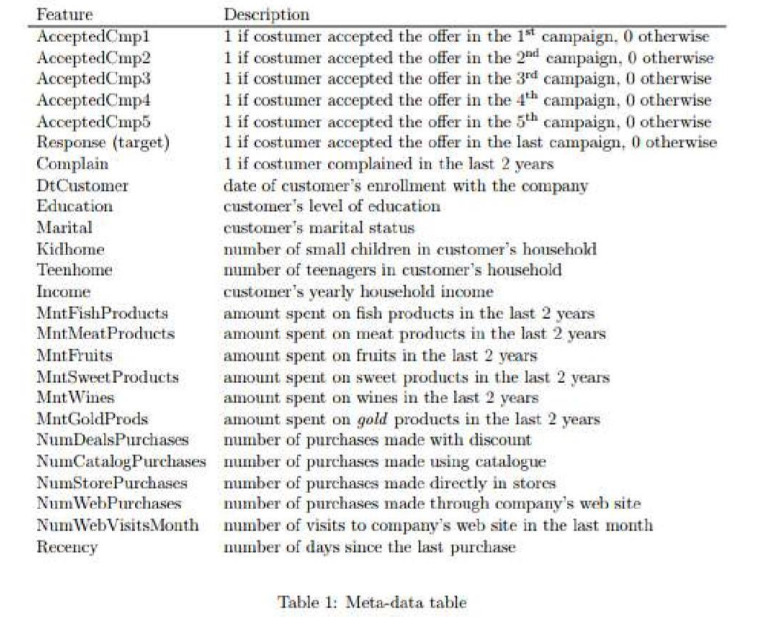

🚨 **As there are some missing and vague column details so we will go through each columns to learn about the dataset**


In [ ]:
df.columns

Index(['Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'Age', 'Customer_Days', 'marital_Divorced', 'marital_Married',
       'marital_Single', 'marital_Together', 'marital_Widow',
       'education_2n Cycle', 'education_Basic', 'education_Graduation',
       'education_Master', 'education_PhD', 'MntTotal', 'MntRegularProds',
       'AcceptedCmpOverall'],
      dtype='object')

### 3.1 Total Products Value

Level 1

In [ ]:
df['MntTotal'].sum()

np.int64(1240896)

Level 2

In [ ]:
total_reg_gold = df[['MntRegularProds', 'MntGoldProds']].sum().sum()
total_reg_gold

np.int64(1240896)

In [ ]:
df['MntRegularProds'] = df['MntRegularProds'].abs()

Level 3

In [ ]:
total_records = df[['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts']].sum().sum()
total_records

np.int64(1240896)

All 3 approaches yield the same total (1,240,896), which implies:

- The product value data is internally consistent.

- MntTotal, MntRegularProds + MntGoldProds, and the sum of detailed product columns are all equal.

### 3.2 Total Offer Accepted

Level 1

In [ ]:
df['AcceptedCmpOverall'].sum().sum()

np.int64(660)

Level 2

In [ ]:
total_coupons = df[['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3',  'AcceptedCmp4', 'AcceptedCmp5']].sum().sum()
total_coupons

np.int64(660)

(AcceptedCmpOverall) is likely a pre-computed column equal to the sum of the 5 individual campaign columns per row

Both sum of overall campaign offers and 5 campaigns offers and equals to 660

### 3.3 Overview Columns with Z* attribute


In [ ]:
df[['Z_CostContact', 'Z_Revenue']].value_counts()

,,count
Z_CostContact,Z_Revenue,
3,11,2205


Z_CostContact = 3 might mean every contact cost (`$3`), and Z_Revenue = 11 means (`$11`) revenue per customer → These do not have any valuable insights.

- The columns won't help with predictive modeling (e.g., regression, classification), because they have no variability.

- They are **drop candidates** from the feature set during preprocessing.



### 3.4 Overview number of purchases columns


In [ ]:
total_columns = {}

for col in df.columns:
  if 'Purchases' in col:
    total_columns[col] = df[col].sum().sum()

print(total_columns)

{'NumDealsPurchases': np.int64(5112), 'NumWebPurchases': np.int64(9042), 'NumCatalogPurchases': np.int64(5833), 'NumStorePurchases': np.int64(12841)}


-> The values from all Number of purchases are unique

### 3.4 Overview number of purchases columns

In [ ]:
df['Customer_Days'].describe()

,Customer_Days
count,2205.000000
mean,2512.718367
std,202.563647
min,2159.000000
25%,2339.000000
50%,2515.000000
75%,2688.000000
max,2858.000000


-> The 'DtCustomer' is now updated to'Customer_Days' columns

### ✅ Complete metadata table version

| **Feature**             | **Description**                                                                 |
|-------------------------|---------------------------------------------------------------------------------|
| AcceptedCmp1            | 1 if customer accepted the offer in the 1st campaign, 0 otherwise               |
| AcceptedCmp2            | 1 if customer accepted the offer in the 2nd campaign, 0 otherwise               |
| AcceptedCmp3            | 1 if customer accepted the offer in the 3rd campaign, 0 otherwise               |
| AcceptedCmp4            | 1 if customer accepted the offer in the 4th campaign, 0 otherwise               |
| AcceptedCmp5            | 1 if customer accepted the offer in the 5th campaign, 0 otherwise               |
| Response (target)       | 1 if customer accepted the offer in the last campaign, 0 otherwise              |
| Complain                | 1 if customer complained in the last 2 years                                    |
| Customer_Days              | Date of customer's enrollment with the company                                  |
| education_2n Cycle      |  1 if Yes, 0 then No                                                                               |
| education_Basic         | 1 if Yes, 0 then No                                                                                |
| education_Graduation    | 1 if Yes, 0 then No                                                                                |
| education_Master        |  1 if Yes, 0 then No                                                                               |
| education_PhD           |  1 if Yes, 0 then No                                                                               |
| marital_Divorced        | 1 if Yes, 0 then No                                                                                |
| marital_Married         | 1 if Yes, 0 then No                                                                                |
| marital_Single          |  1 if Yes, 0 then No                                                                               |
| marital_Together        | 1 if Yes, 0 then No                                                                                |
| marital_Widow           | 1 if Yes, 0 then No                                                                                 |
| Kidhome                 | Number of small children in customer's household                                |
| Teenhome                | Number of teenagers in customer's household                                     |
| Income                  | Customer's yearly household income                                              |
| MntFishProducts         | Amount spent on fish products in the last 2 years                               |
| MntMeatProducts         | Amount spent on meat products in the last 2 years                               |
| MntFruits               | Amount spent on fruits in the last 2 years                                      |
| MntSweetProducts        | Amount spent on sweet products in the last 2 years                              |
| MntWines                | Amount spent on wines in the last 2 years                                       |
| MntGoldProds            | Amount spent on gold products in the last 2 years                               |
| MntRegularProds                 | Amount spent on regular products in the last 2 years                                         |
| NumDealsPurchases       | Number of purchases made with discount                                          |
| NumCatalogPurchases     | Number of purchases made using catalogue                                        |
| NumStorePurchases       | Number of purchases made directly in stores                                     |
| NumWebPurchases         | Number of purchases made through company's website                              |
| NumWebVisitsMonth       | Number of visits to company's website in the last month                         |
| Recency                 | Number of days since the last purchase                                          |
| AcceptedCmpOverall                 | Total offers customer accepted
          |
| Z_CostContact                 | Value of 3
          |
| Z_Revenue	                 | Value of 11
          |

## **4. Data profiling 🪄**

### 4.1 Look at 5 random rows

In [ ]:
df.sample(5)

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,marital_Together,marital_Widow,education_2n Cycle,education_Basic,education_Graduation,education_Master,education_PhD,MntTotal,MntRegularProds,AcceptedCmpOverall
1578,44512.0,1,1,57,23,1,6,0,0,2,...,1,0,0,0,1,0,0,30,28,0
280,29672.0,1,1,6,9,1,3,0,4,8,...,1,0,0,0,1,0,0,17,9,0
2011,60689.0,0,1,23,240,90,216,63,6,24,...,0,0,0,0,1,0,0,615,591,0
1097,36262.0,0,0,24,88,39,54,64,28,153,...,0,0,0,0,0,1,0,273,120,1
1078,27590.0,1,0,38,6,0,5,0,0,1,...,1,0,0,0,0,1,0,11,10,0


### 4.2 Data Types and Fundamental Information

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2205 entries, 0 to 2204
Data columns (total 39 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Income                2205 non-null   float64
 1   Kidhome               2205 non-null   int64  
 2   Teenhome              2205 non-null   int64  
 3   Recency               2205 non-null   int64  
 4   MntWines              2205 non-null   int64  
 5   MntFruits             2205 non-null   int64  
 6   MntMeatProducts       2205 non-null   int64  
 7   MntFishProducts       2205 non-null   int64  
 8   MntSweetProducts      2205 non-null   int64  
 9   MntGoldProds          2205 non-null   int64  
 10  NumDealsPurchases     2205 non-null   int64  
 11  NumWebPurchases       2205 non-null   int64  
 12  NumCatalogPurchases   2205 non-null   int64  
 13  NumStorePurchases     2205 non-null   int64  
 14  NumWebVisitsMonth     2205 non-null   int64  
 15  AcceptedCmp3         

### 4.3 Data Descriptions

In [ ]:
df.describe()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,marital_Together,marital_Widow,education_2n Cycle,education_Basic,education_Graduation,education_Master,education_PhD,MntTotal,MntRegularProds,AcceptedCmpOverall
count,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,...,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.00000
mean,51622.094785,0.442177,0.506576,49.009070,306.164626,26.403175,165.312018,37.756463,27.128345,44.057143,...,0.257596,0.034467,0.089796,0.024490,0.504762,0.165079,0.215873,562.764626,519.251701,0.29932
std,20713.063826,0.537132,0.544380,28.932111,337.493839,39.784484,217.784507,54.824635,41.130468,51.736211,...,0.437410,0.182467,0.285954,0.154599,0.500091,0.371336,0.411520,575.936911,553.336825,0.68044
min,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0.00000
25%,35196.000000,0.000000,0.000000,24.000000,24.000000,2.000000,16.000000,3.000000,1.000000,9.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,56.000000,42.000000,0.00000
50%,51287.000000,0.000000,0.000000,49.000000,178.000000,8.000000,68.000000,12.000000,8.000000,25.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,343.000000,288.000000,0.00000
75%,68281.000000,1.000000,1.000000,74.000000,507.000000,33.000000,232.000000,50.000000,34.000000,56.000000,...,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,964.000000,884.000000,0.00000
max,113734.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,262.000000,321.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2491.000000,2458.000000,4.00000


## **5. Data cleaning 🧹**

### 5.1 Drop two unnecessary columns

In [ ]:
df = df.drop(['Z_CostContact', 'Z_Revenue'], axis = 1)

In [ ]:
df.columns

Index(['Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response', 'Age', 'Customer_Days',
       'marital_Divorced', 'marital_Married', 'marital_Single',
       'marital_Together', 'marital_Widow', 'education_2n Cycle',
       'education_Basic', 'education_Graduation', 'education_Master',
       'education_PhD', 'MntTotal', 'MntRegularProds', 'AcceptedCmpOverall'],
      dtype='object')

### 5.2 Checking N/A values

In [ ]:
df.isnull().sum()

,0
Income,0
Kidhome,0
Teenhome,0
Recency,0
MntWines,0
MntFruits,0
MntMeatProducts,0
MntFishProducts,0
MntSweetProducts,0
MntGoldProds,0


### 5.3 Find duplicates

In [ ]:
num_duplicates = df.duplicated().sum()
print(f"🔁 Number of duplicate rows: {num_duplicates}")

🔁 Number of duplicate rows: 184


In [ ]:
df = df.drop_duplicates()

Check again

In [ ]:
num_duplicates = df.duplicated().sum()
print(f"🔁 Number of duplicate rows: {num_duplicates}")

🔁 Number of duplicate rows: 0


### 5.4 Fix the column name format

In [ ]:
df = df.rename({'education_2n Cycle': 'education_2ndCycle'}, axis=1)

In [ ]:
df['education_2ndCycle'].sample(5)

,education_2ndCycle
354,0
1189,0
1004,0
1720,0
2080,0


### 5.5 Fix education graduate columns

🛠️ According to **Studera.nu**, The second cycle corresponds to graduate level or master's level studies.

The columns 'education_2ndCycle' and 'education_Master' are overlapping -> I'm combining the two into one column for better clarification

In [ ]:
df[['education_2ndCycle', 'education_Master']].value_counts()

education_2ndCycle  education_Master
0                   0                   1503
                    1                    335
1                   0                    183
Name: count, dtype: int64

In [ ]:
df['education_GraduateStudy'] = df[['education_2ndCycle', 'education_Master']].max(axis=1)
df['education_GraduateStudy'].sample(5)

,education_GraduateStudy
1854,0
2107,0
1947,0
1363,0
1506,1


In [ ]:
df = df.drop(['education_2ndCycle', 'education_Master'], axis = 1)

## **6. EDA (Exploratory Data Analysis) 🔬**

### Total spending from each categories at level 2

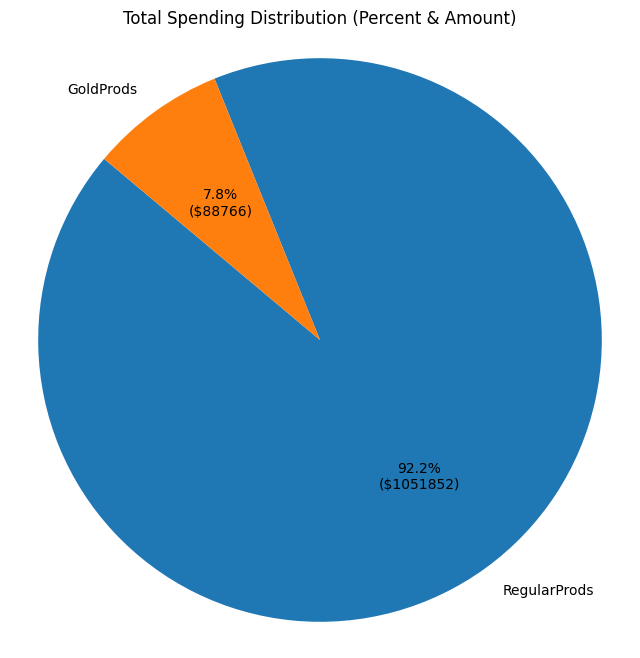

In [ ]:
#Gather information and identify the features
mnt_GolReg_columns = ['MntRegularProds', 'MntGoldProds']

totals = df[mnt_GolReg_columns].sum()

labels = [col.replace('Mnt', '') for col in mnt_GolReg_columns]

# Configure the chart
def autopct_format(pct, allvals):
    total = sum(allvals)
    val = int(round(pct * total / 100.0))
    return f'{pct:.1f}%\n(${val})'

plt.figure(figsize=(8, 8))
plt.pie(
    totals,
    labels=labels,
    autopct=lambda pct: autopct_format(pct, totals),
    startangle=140
 )

plt.title('Total Spending Distribution (Percent & Amount)')
plt.axis('equal')
plt.show()

Regular products dominate customer spending, accounting for 92.3% of the total. This suggests that the mass market prefer regular items, likely due to affordability or accessibility. In contrast, Gold (luxury) products make up only 7.7%, indicating they are a niche choice, possibly appealing to a small, high-end segment of the customer base.

### Total spending from each categories at level 3

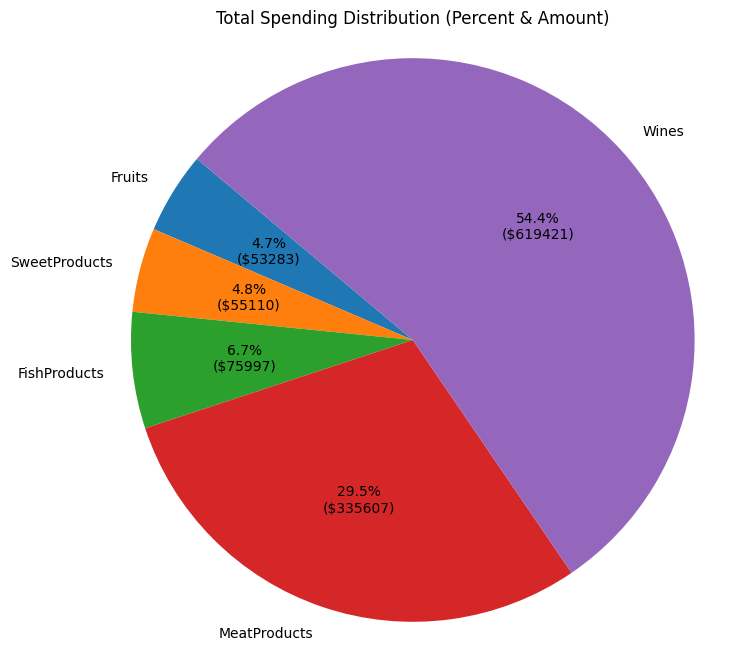

In [ ]:
#Gather information and identify the features
mnt_columns = ['MntFruits', 'MntSweetProducts', 'MntFishProducts', 'MntMeatProducts', 'MntWines']

totals = df[mnt_columns].sum()

labels = [col.replace('Mnt', '') for col in mnt_columns]

# Configure the chart
def autopct_format(pct, allvals):
    total = sum(allvals)
    val = int(round(pct * total / 100.0))
    return f'{pct:.1f}%\n(${val})'

plt.figure(figsize=(8, 8))
plt.pie(
    totals,
    labels=labels,
    autopct=lambda pct: autopct_format(pct, totals),
    startangle=140
 )

plt.title('Total Spending Distribution (Percent & Amount)')
plt.axis('equal')
plt.show()

Over half of total spending (54.6%) goes to Wines, followed by MeatProducts (29.2%). The remaining categories — Fish, SweetProducts, and Fruits — make up less than 17% combined, showing a strong skew toward wine and meat purchases. This suggests customer preference or marketing focus is heavily concentrated on these two categories.

### The effectiveness of each campaigns



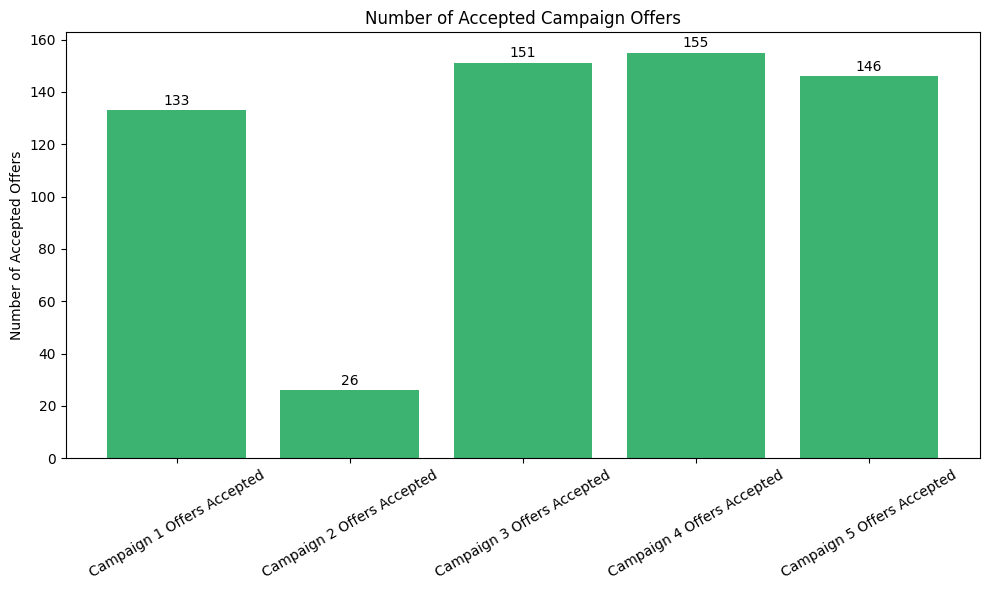

In [ ]:
#Gather information and identify the features
cmp_columns = ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3',  'AcceptedCmp4', 'AcceptedCmp5']

totals = df[cmp_columns].sum()

label_map = {
    'AcceptedCmp1': 'Campaign 1 Offers Accepted',
    'AcceptedCmp2': 'Campaign 2 Offers Accepted',
    'AcceptedCmp3': 'Campaign 3 Offers Accepted',
    'AcceptedCmp4': 'Campaign 4 Offers Accepted',
    'AcceptedCmp5': 'Campaign 5 Offers Accepted',
}

labels = [label_map[col] for col in cmp_columns]

# Configure the chart
plt.figure(figsize=(10, 6))
bars = plt.bar(labels,
               totals,
               color='mediumseagreen')

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 1, int(height), ha='center', va='bottom')

plt.title('Number of Accepted Campaign Offers')
plt.ylabel('Number of Accepted Offers')
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

- Campaign 4 had the highest number of accepted offers (155), followed closely by Campaign 3 (146) and Campaign 5 (140).
- Campaign 1 had moderate success with 128 acceptances, while Campaign 2 underperformed significantly with only 26 accepted offers.

### Profits generated by previous campaigns

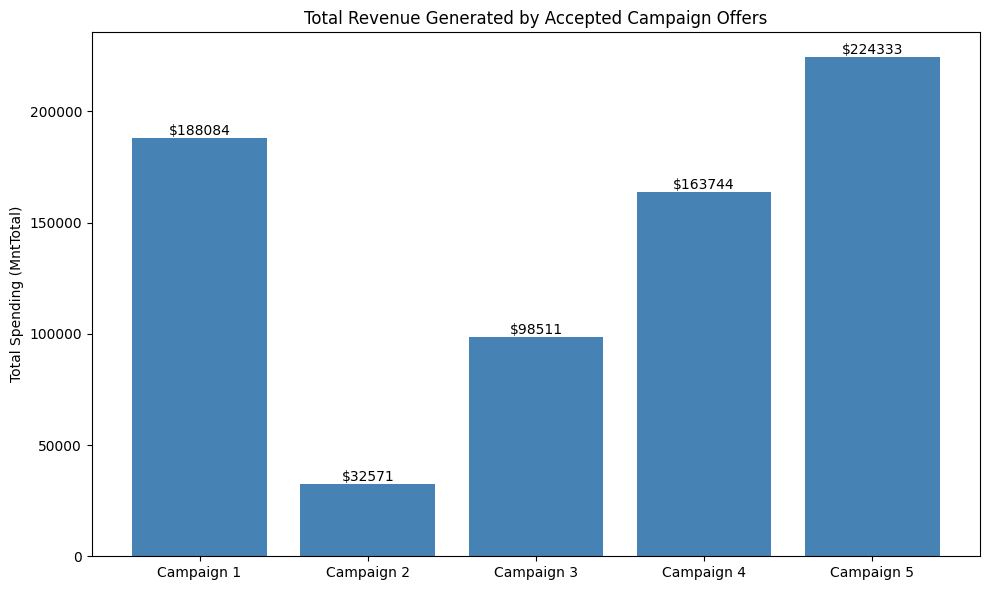

In [ ]:
#Sum the total profit based on accepted offers from each campaigns
campaign_totals = [df[df[col] == 1]['MntTotal'].sum() for col in cmp_columns]

#Configure labels and chart bar
labels = [f'Campaign {i+1}' for i in range(len(cmp_columns))]
plt.figure(figsize=(10, 6))
bars = plt.bar(labels, campaign_totals, color='steelblue')

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 5, f"${int(height)}", ha='center', va='bottom')

plt.title('Total Revenue Generated by Accepted Campaign Offers')
plt.ylabel('Total Spending (MntTotal)')
plt.tight_layout()
plt.show()

- Campaign 5 generated the highest revenue at (`$214,022`), making it the top performer.

- Campaign 1 also performed well with (`$179,300`), followed closely by Campaign 4 at (`$163,744`).

- Campaign 3 had moderate impact, generating (`$91,952`).

- Campaign 2 brought in the lowest revenue at just (`$32,571`), aligning with its low number of accepted offers.

### Correlation between Income and Total Cart Value  

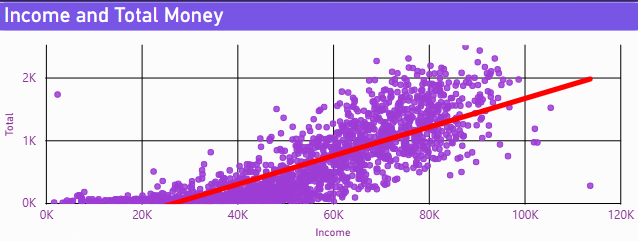

- This scatter plot illustrates the relationship between "Income" (on the x-axis, ranging from 0 to 120K) and "Total Money" (on the y-axis, ranging from 0 to 2K).

- Based on the steep lean of the trend line and the spread of data points, it indicates a strong positive relationship between "Income" and total cart value

### Relationship between Channels and Total Payment  

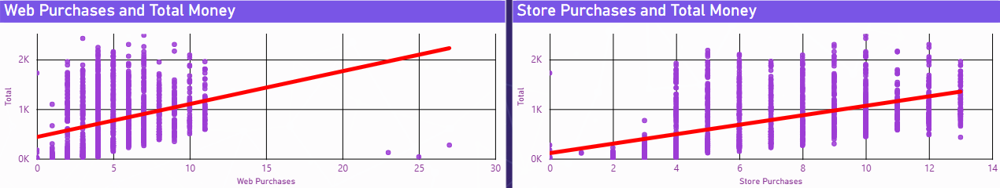

Both web and store purchases show a positive linear relationship with the total amount of money spent, meaning more purchases (either online or in-store) are associated with higher total spending.

- The online channel has recorded more visits per person (27 visits) than the mortar and brick (13 visits) store

### Relationship between Catalog Purchases and Total Payment  

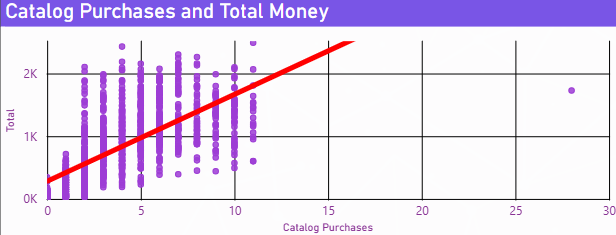

- As the number of catalog purchases increases, total spending tends to increase as well.

- Although the data points are in a very chaotic order, it still shows a very high correlation between features due to steeply high trendline.

## **7. Correlations Model 📊**

In [ ]:
selected_cols = [
    'Income', 'Kidhome', 'Teenhome', 'Recency',
    'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
    'NumStorePurchases', 'NumWebVisitsMonth', 'Complain', 'Response',
    'Age', 'Customer_Days', 'AcceptedCmp3', 'AcceptedCmp4',
    'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',
    'marital_Divorced', 'marital_Married', 'marital_Single',
    'marital_Together', 'marital_Widow',
    'education_Basic', 'education_Graduation',
    'education_PhD', 'education_GraduateStudy', 'MntTotal'
]

correlation_matrix = df[selected_cols].corr()

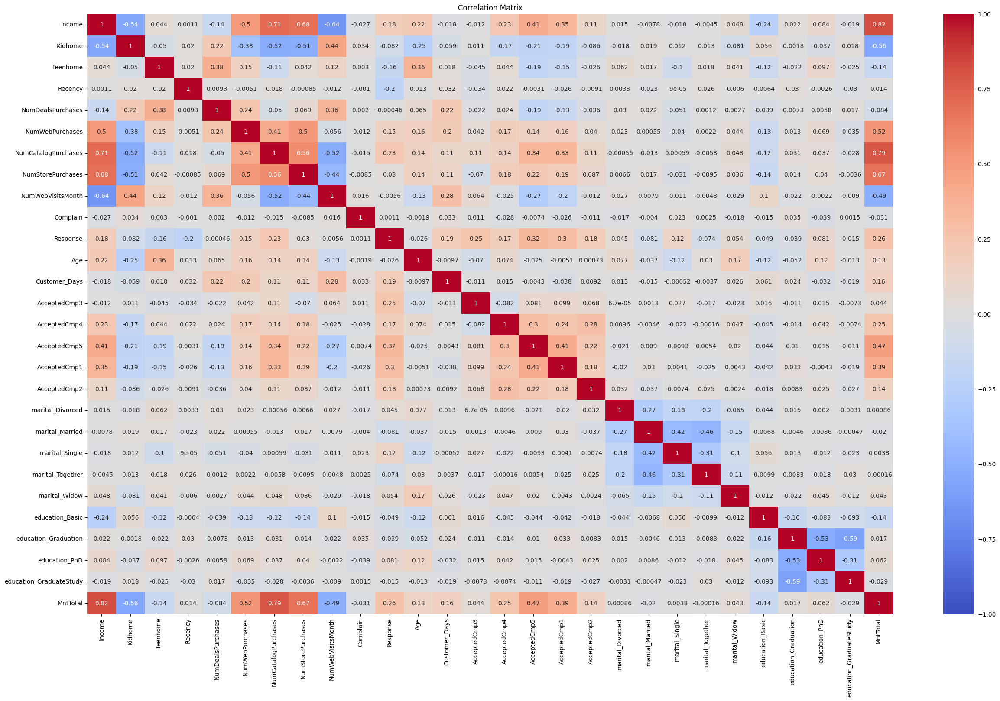

In [ ]:
plt.figure(figsize=(30, 18))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()

## **8. Model Testing ✏️**

### Testing the RMSE and R² from all possible regression models

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

In [ ]:
df.columns

Index(['Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response', 'Age', 'Customer_Days',
       'marital_Divorced', 'marital_Married', 'marital_Single',
       'marital_Together', 'marital_Widow', 'education_Basic',
       'education_Graduation', 'education_PhD', 'MntTotal', 'MntRegularProds',
       'AcceptedCmpOverall', 'education_GraduateStudy'],
      dtype='object')

In [ ]:
x = df[[
    'Income', 'Kidhome', 'Teenhome', 'Recency',
    'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
    'NumStorePurchases', 'NumWebVisitsMonth', 'Complain', 'Response',
    'Age', 'Customer_Days', 'AcceptedCmp3', 'AcceptedCmp4',
    'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',
    'marital_Divorced', 'marital_Married', 'marital_Single',
    'marital_Together', 'marital_Widow',
    'education_Basic', 'education_Graduation',
    'education_PhD', 'education_GraduateStudy'
]]

y = df['MntTotal']

In [ ]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from xgboost import XGBRegressor

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

models = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(alpha=1.0),
    'Lasso Regression': Lasso(alpha=0.01),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'XGBoost': XGBRegressor(n_estimators=100, random_state=42, verbosity=0)
}

for name, model in models.items():
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    print(f"\n🔍 {name}")
    print(f"RMSE: {rmse:.2f}")
    print(f"R²: {r2:.4f}")


🔍 Linear Regression
RMSE: 244.96
R²: 0.8225

🔍 Ridge Regression
RMSE: 244.89
R²: 0.8226

🔍 Lasso Regression
RMSE: 244.96
R²: 0.8225

🔍 Random Forest
RMSE: 192.04
R²: 0.8909

🔍 XGBoost
RMSE: 194.64
R²: 0.8879


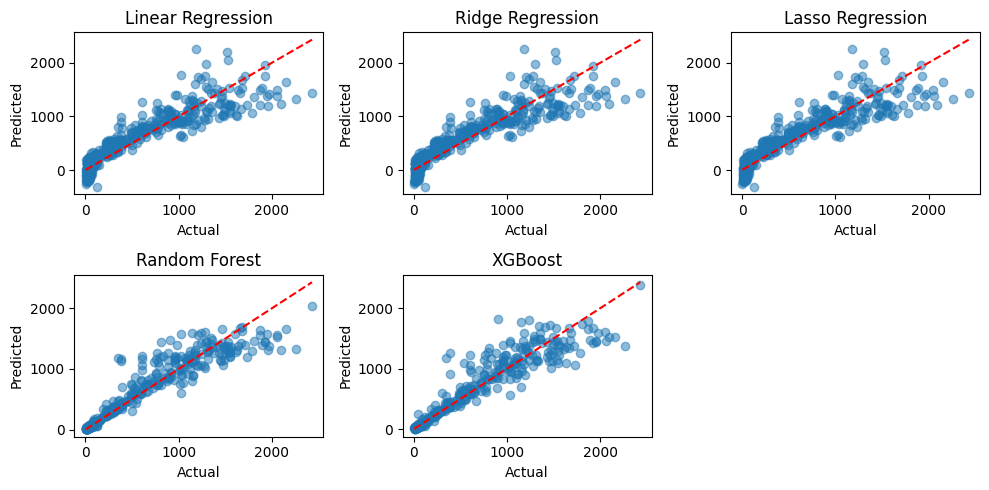

In [ ]:
# Train models
lr_model = LinearRegression()
ridge_model = Ridge(alpha=1.0)
lasso_model = Lasso(alpha=0.01)
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
xgb_model = XGBRegressor(n_estimators=100, random_state=42)

# Fit models
lr_model.fit(x_train, y_train)
ridge_model.fit(x_train, y_train)
lasso_model.fit(x_train, y_train)
rf_model.fit(x_train, y_train)
xgb_model.fit(x_train, y_train)

# Predictions
y_pred_lr = lr_model.predict(x_test)
y_pred_ridge = ridge_model.predict(x_test)
y_pred_lasso = lasso_model.predict(x_test)
y_pred_rf = rf_model.predict(x_test)
y_pred_xgb = xgb_model.predict(x_test)

# Configure scatter charts and predictions
y_min = y_test.min()
y_max = y_test.max()

plt.figure(figsize=(10, 5))

# Linear Regression
plt.subplot(2, 3, 1)
plt.scatter(y_test, y_pred_lr, alpha=0.5)
plt.plot([y_min, y_max], [y_min, y_max], 'r--')
plt.title('Linear Regression')
plt.xlabel('Actual')
plt.ylabel('Predicted')

# Ridge Regression
plt.subplot(2, 3, 2)
plt.scatter(y_test, y_pred_ridge, alpha=0.5)
plt.plot([y_min, y_max], [y_min, y_max], 'r--')
plt.title('Ridge Regression')
plt.xlabel('Actual')
plt.ylabel('Predicted')

# Lasso Regression
plt.subplot(2, 3, 3)
plt.scatter(y_test, y_pred_lasso, alpha=0.5)
plt.plot([y_min, y_max], [y_min, y_max], 'r--')
plt.title('Lasso Regression')
plt.xlabel('Actual')
plt.ylabel('Predicted')

# Random Forest
plt.subplot(2, 3, 4)
plt.scatter(y_test, y_pred_rf, alpha=0.5)
plt.plot([y_min, y_max], [y_min, y_max], 'r--')
plt.title('Random Forest')
plt.xlabel('Actual')
plt.ylabel('Predicted')

# XGBoost
plt.subplot(2, 3, 5)
plt.scatter(y_test, y_pred_xgb, alpha=0.5)
plt.plot([y_min, y_max], [y_min, y_max], 'r--')
plt.title('XGBoost')
plt.xlabel('Actual')
plt.ylabel('Predicted')

plt.tight_layout()
plt.show()


- Linear, Ridge and Lasso models have the best rutime comparing to Random Forest and XGBoost about 2-3 seconds. They have similar results with the RMSE equals 256 around and R² is approximately 0.82.

- The Radom Forest have the best results when it dominates R² score with 0.89 and enjoys a lowest RMSE (192.04). In the scatter chart, the Radom Forest's data points are more evenly.

=> The Radom Forest provides a much more trustworthy number and have predicted and actual vales close to each other.


## **9. Build regression model 🧮**


### Random Forest Model

In [ ]:
x = df[[
    'Income', 'Kidhome', 'Teenhome', 'Recency',
    'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
    'NumStorePurchases', 'NumWebVisitsMonth', 'Complain', 'Response',
    'Age', 'Customer_Days', 'AcceptedCmp3', 'AcceptedCmp4',
    'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',
    'marital_Divorced', 'marital_Married', 'marital_Single',
    'marital_Together', 'marital_Widow',
    'education_Basic', 'education_Graduation',
    'education_PhD', 'education_GraduateStudy'
]]

y = df['MntTotal']

In [ ]:
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(x, y)

RandomForestRegressor(random_state=42)

In [ ]:
importances = rf_model.feature_importances_

In [ ]:
feature_importance_df = pd.DataFrame({
    'Feature': x.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

In [ ]:
print(feature_importance_df)

                    Feature  Importance
0                    Income    0.396053
6       NumCatalogPurchases    0.373028
7         NumStorePurchases    0.092041
12            Customer_Days    0.029119
5           NumWebPurchases    0.021925
15             AcceptedCmp5    0.014529
8         NumWebVisitsMonth    0.014348
11                      Age    0.013469
3                   Recency    0.011646
2                  Teenhome    0.006268
4         NumDealsPurchases    0.004264
14             AcceptedCmp4    0.002939
10                 Response    0.002843
16             AcceptedCmp1    0.002495
25            education_PhD    0.002234
24     education_Graduation    0.001742
13             AcceptedCmp3    0.001610
19          marital_Married    0.001514
21         marital_Together    0.001463
18         marital_Divorced    0.001444
20           marital_Single    0.001403
26  education_GraduateStudy    0.001220
22            marital_Widow    0.001013
1                   Kidhome    0.000696


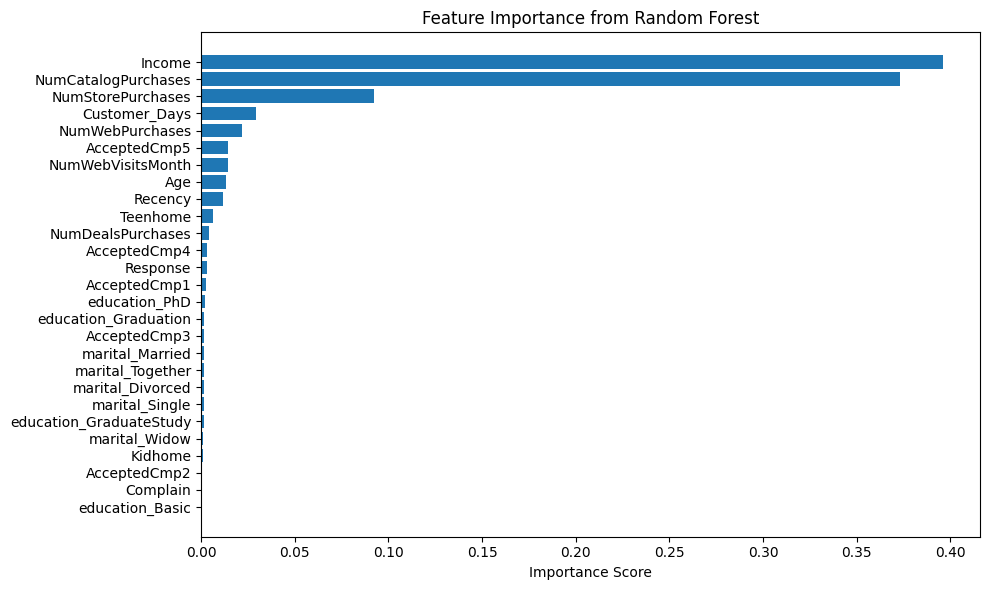

In [ ]:
plt.figure(figsize=(10,6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance Score')
plt.title('Feature Importance from Random Forest')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

From the bar chart, I will adjust the model and not include some least important features such as Complain (0.000048), all education status (mostly lower than 0.003), all marital status (mostly lower than 0.002) and Response (0.0028)

There are some low scored features but it's in the group with high scored feature, so I will keep those for further analysis.

### **Adjust the model**

In [ ]:
x = df[[
    'Income', 'Kidhome', 'Teenhome', 'Recency',
    'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
    'NumStorePurchases', 'NumWebVisitsMonth', 'Response',
    'Age', 'Customer_Days', 'AcceptedCmp3', 'AcceptedCmp4',
    'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2'
]]

y = df['MntTotal']

In [ ]:
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(x, y)

RandomForestRegressor(random_state=42)

In [ ]:
importances = rf_model.feature_importances_

In [ ]:
feature_importance_df = pd.DataFrame({
    'Feature': x.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

In [ ]:
print(feature_importance_df)

                Feature  Importance
0                Income    0.397792
6   NumCatalogPurchases    0.374069
7     NumStorePurchases    0.093359
11        Customer_Days    0.030341
5       NumWebPurchases    0.022772
8     NumWebVisitsMonth    0.015429
14         AcceptedCmp5    0.014783
10                  Age    0.014636
3               Recency    0.013265
2              Teenhome    0.006451
4     NumDealsPurchases    0.004876
13         AcceptedCmp4    0.003229
9              Response    0.003028
15         AcceptedCmp1    0.002670
12         AcceptedCmp3    0.001807
1               Kidhome    0.000819
16         AcceptedCmp2    0.000676


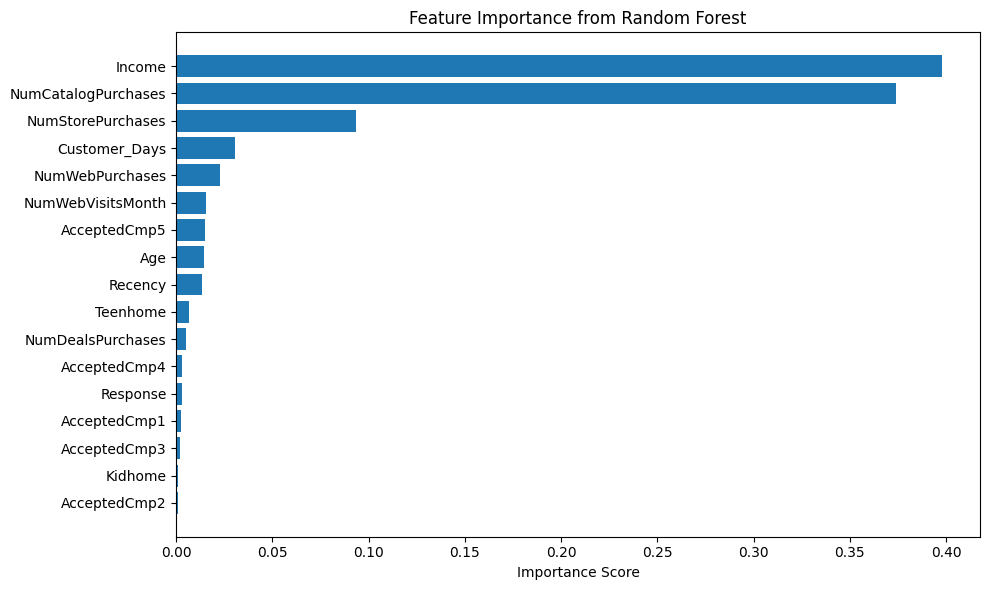

In [ ]:
plt.figure(figsize=(10,6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance Score')
plt.title('Feature Importance from Random Forest')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

## **10. Hypothesis for forecasting 👨🏻‍💻**

Which feature generates the most profit?

### 10.1 Hypothesis 1: Customer's income is equivalent to the total cart value


In [ ]:
test_data = pd.DataFrame({
    'Income': [30000, 50000, 60000],
    'Kidhome': [0, 0, 0],
    'Teenhome': [0, 0, 0],
    'Recency': [49, 49, 49],
    'NumDealsPurchases': [0, 0, 0],
    'NumWebPurchases': [4, 4, 4],
    'NumCatalogPurchases': [0, 0, 0],
    'NumStorePurchases': [4, 4, 4],
    'NumWebVisitsMonth': [0, 0, 0],
    'Response': [0, 0, 0],
    'Age': [43, 43, 43],
    'Customer_Days': [2515, 2515, 2515],
    'AcceptedCmp3': [0, 0, 0],
    'AcceptedCmp4': [0, 0, 0],
    'AcceptedCmp5': [0, 0, 0],
    'AcceptedCmp1': [0, 0, 0],
    'AcceptedCmp2': [0, 0, 0]
})

predictions_1 = rf_model.predict(test_data)

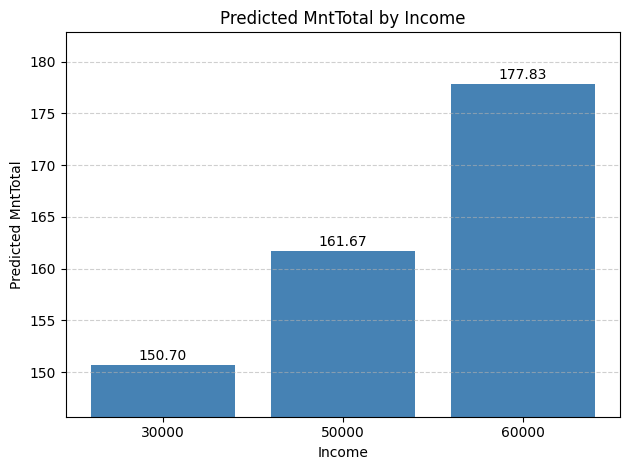

In [ ]:
# Plot values
plt.bar(test_data['Income'].astype(str), predictions_1, color='steelblue')
plt.title('Predicted MntTotal by Income')
plt.xlabel('Income')
plt.ylabel('Predicted MntTotal')
plt.ylim(min(predictions_1) - 5, max(predictions_1) + 5)
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Annotate bars
for i, val in enumerate(predictions_1):
    plt.text(i, val + 0.5, f'{val:.2f}', ha='center')

plt.tight_layout()
plt.show()

This bar chart shows that predicted total spending (MntTotal) increases with income. As income rises from 30,000 to 60,000, predicted spending grows from 150.70 to 177.83, indicating a positive relationship between income and consumer spending.

### 10.2 Hypothesis 2: Customer tends to make more purchases by using business catalogue


In [ ]:
test_data = pd.DataFrame({
    'Income': [50000, 50000],
    'Kidhome': [0, 0],
    'Teenhome': [0, 0],
    'Recency': [49, 49],
    'NumDealsPurchases': [0, 0],
    'NumWebPurchases': [4, 4],
    'NumCatalogPurchases': [0, 1],
    'NumStorePurchases': [4, 4],
    'NumWebVisitsMonth': [0, 0],
    'Response': [0, 0],
    'Age': [43, 43],
    'Customer_Days': [2515, 2515],
    'AcceptedCmp3': [0, 0],
    'AcceptedCmp4': [0, 0],
    'AcceptedCmp5': [0, 0],
    'AcceptedCmp1': [0, 0],
    'AcceptedCmp2': [0, 0]
})

predictions_2 = rf_model.predict(test_data)

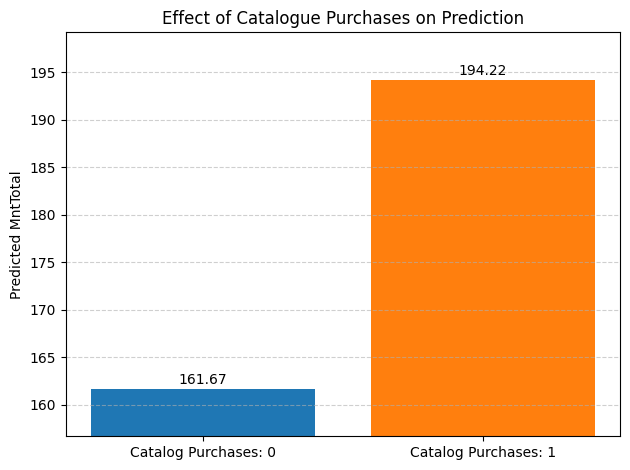

In [ ]:
# Plot values
labels = ['Catalog Purchases: 0', 'Catalog Purchases: 1']
values = predictions_2

plt.bar(labels, values, color=['#1f77b4', '#ff7f0e'])
plt.title('Effect of Catalogue Purchases on Prediction')
plt.ylabel('Predicted MntTotal')
plt.ylim(min(values) - 5, max(values) + 5)
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Annotate bars
for i, v in enumerate(values):
    plt.text(i, v + 0.5, f'{v:.2f}', ha='center', fontsize=10)

plt.tight_layout()
plt.show()

The chart shows that customers who made two catalogue purchases are predicted to spend significantly more (194.22) compared to those who made none (161.67), indicating a strong positive impact of catalogue purchases on total spending.

### 10.3 Hypothesis 3: Customers love to pay more when going shopping at brick-and-mortar store

#### 10.3.1 - Case 1: Customers spending behaviors without campaign 5

In [ ]:
test_data = pd.DataFrame({
  'Income': [50000 , 50000],
  'Kidhome': [0, 0],
  'Teenhome': [0, 0],
  'Recency': [49, 49],
  'NumDealsPurchases': [0, 0],
  'NumWebPurchases': [5, 0],
  'NumCatalogPurchases': [1, 1],
  'NumStorePurchases': [0, 5],
  'NumWebVisitsMonth': [0, 0],
  'Response': [0, 0],
  'Age': [30, 30],
  'Customer_Days': [2515, 2515],
  'AcceptedCmp3': [0, 0],
  'AcceptedCmp4': [0, 0],
  'AcceptedCmp5': [0, 0],
  'AcceptedCmp1': [0, 0],
  'AcceptedCmp2': [0, 0]
})

predictions_3_1 = rf_model.predict(test_data)

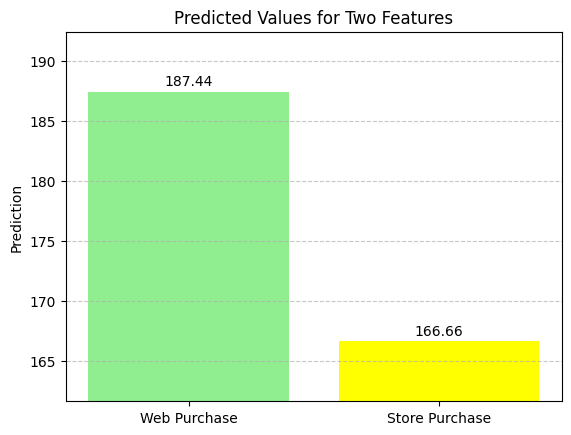

In [ ]:
values = predictions_3_1
labels = ['Web Purchase', 'Store Purchase']

plt.bar(labels, values, color=['lightgreen', 'yellow'])
plt.title('Predicted Values for Two Features')
plt.ylabel('Prediction')
plt.ylim(min(values) - 5, max(values) + 5)
plt.grid(axis='y', linestyle='--', alpha=0.7)

for i, v in enumerate(values):
    plt.text(i, v + 0.5, f'{v:.2f}', ha='center')

plt.show()

With the 2 customers have the same characteristics, and don't use any offers from the campaign 5. Person who makes the transaction on the web, have spent more money (170.07) than store goer with (162.2)

#### 10.3.2 - Case 2: Customers spending behaviors with offers from marketing campaign 5

In [ ]:
test_data = pd.DataFrame({
  'Income': [50000 , 50000],
  'Kidhome': [0, 0],
  'Teenhome': [0, 0],
  'Recency': [49, 49],
  'NumDealsPurchases': [0, 0],
  'NumWebPurchases': [5, 0],
  'NumCatalogPurchases': [1, 1],
  'NumStorePurchases': [0, 5],
  'NumWebVisitsMonth': [0, 0],
  'Response': [0, 0],
  'Age': [30, 30],
  'Customer_Days': [2515, 2515],
  'AcceptedCmp3': [0, 0],
  'AcceptedCmp4': [0, 0],
  'AcceptedCmp5': [1, 1],
  'AcceptedCmp1': [0, 0],
  'AcceptedCmp2': [0, 0]
})

predictions_3_2 = rf_model.predict(test_data)

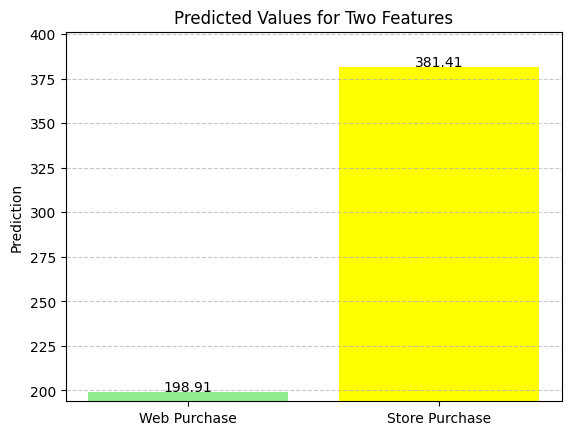

In [ ]:
values = predictions_3_2
labels = ['Web Purchase', 'Store Purchase']

plt.bar(labels, values, color=['lightgreen', 'yellow'])
plt.title('Predicted Values for Two Features')
plt.ylabel('Prediction')
plt.ylim(min(values) - 5, max(values) + 20)
plt.grid(axis='y', linestyle='--', alpha=0.7)

for i, v in enumerate(values):
    plt.text(i, v + 0.5, f'{v:.2f}', ha='center')

plt.show()

On the other hand, with the same setting, I add campaign 5 offer accepted for both customers. Surprisingly, the physical store purchase value skyrocketed up to 377.7, while the web purchase just only increase a little up to 10 values (182.23)

### 10.4 Hypothesis 4: Marketing Campaign 5 proven to be successful

In [86]:
test_data = pd.DataFrame({
    'Income': [64000] * 5,
    'Kidhome': [0] * 5,
    'Teenhome': [0] * 5,
    'Recency': [49] * 5,
    'NumDealsPurchases': [0] * 5,
    'NumWebPurchases': [4] * 5,
    'NumCatalogPurchases': [0] * 5,
    'NumStorePurchases': [4] * 5,
    'NumWebVisitsMonth': [0] * 5,
    'Response': [0] * 5,
    'Age': [43] * 5,
    'Customer_Days': [2515] * 5,
    'AcceptedCmp3': [0, 0, 1, 0, 0],
    'AcceptedCmp4': [0, 0, 0, 1, 0],
    'AcceptedCmp5': [0, 0, 0, 0, 1],
    'AcceptedCmp1': [1, 0, 0, 0, 0],
    'AcceptedCmp2': [0, 1, 0, 0, 0]
})

predictions_4_1 = rf_model.predict(test_data)

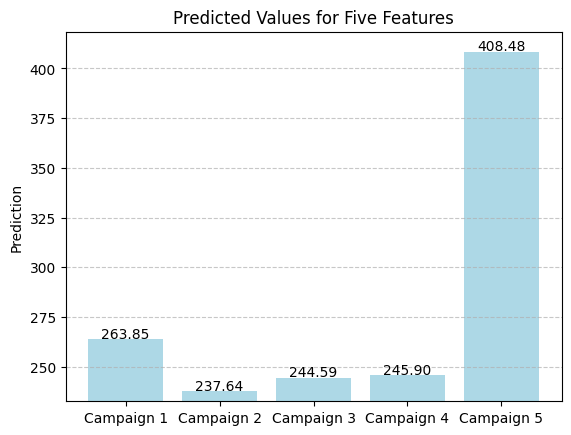

In [87]:
values = predictions_4_1
labels = ['Campaign 1', 'Campaign 2', 'Campaign 3', 'Campaign 4', 'Campaign 5']

plt.bar(labels, values, color='lightblue')
plt.title('Predicted Values for Five Features')
plt.ylabel('Prediction')
plt.ylim(min(values) - 5, max(values) + 10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

for i, v in enumerate(values):
    plt.text(i, v + 0.5, f'{v:.2f}', ha='center')

plt.show()

The chart shows that Campaign 5 has the strongest impact on predicted spending (173.24), while the other campaigns have minimal or similar effects, with predictions around 161–162, suggesting Campaign 5 is the most effective in driving customer purchases.

### 10.5 Hypothesis 5: Business benefits the most from old customer

In [ ]:
test_data = pd.DataFrame({
  'Income': [55000 , 55000],
  'Kidhome': [0, 0],
  'Teenhome': [0, 0],
  'Recency': [49, 49],
  'NumDealsPurchases': [0, 0],
  'NumWebPurchases': [4, 4],
  'NumCatalogPurchases': [0, 0],
  'NumStorePurchases': [4, 4],
  'NumWebVisitsMonth': [0, 0],
  'Response': [0, 0],
  'Age': [43, 43],
  'Customer_Days': [2340, 2688],
  'AcceptedCmp3': [0, 0],
  'AcceptedCmp4': [0, 0],
  'AcceptedCmp5': [0, 0],
  'AcceptedCmp1': [0, 0],
  'AcceptedCmp2': [0, 0]
})

predictions_5 = rf_model.predict(test_data)

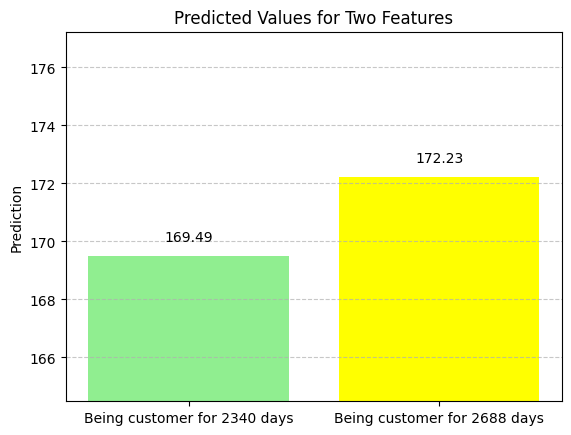

In [ ]:
values = predictions_5
labels = ['Being customer for 2340 days', 'Being customer for 2688 days']

plt.bar(labels, values, color=['lightgreen', 'yellow'])
plt.title('Predicted Values for Two Features')
plt.ylabel('Prediction')
plt.ylim(min(values) - 5, max(values) + 5)
plt.grid(axis='y', linestyle='--', alpha=0.7)

for i, v in enumerate(values):
    plt.text(i, v + 0.5, f'{v:.2f}', ha='center')

plt.show()

The bar chart illustrates that the predicted value for a customer with 2688 days of tenure (172.23) is higher than for a customer with 2340 days of tenure (169.49).

### 10.6 Hypothesis 6: A family with teen and kid comparison

In [ ]:
test_data = pd.DataFrame({
  'Income': [55000 , 55000],
  'Kidhome': [1, 0],
  'Teenhome': [0, 1],
  'Recency': [49, 49],
  'NumDealsPurchases': [0, 0],
  'NumWebPurchases': [4, 4],
  'NumCatalogPurchases': [0, 0],
  'NumStorePurchases': [0, 0],
  'NumWebVisitsMonth': [0, 0],
  'Response': [0, 0],
  'Age': [43, 43],
  'Customer_Days': [2515, 2515],
  'AcceptedCmp3': [0, 0],
  'AcceptedCmp4': [0, 0],
  'AcceptedCmp5': [0, 0],
  'AcceptedCmp1': [0, 0],
  'AcceptedCmp2': [0, 0]
})

predictions_6_1 = rf_model.predict(test_data)

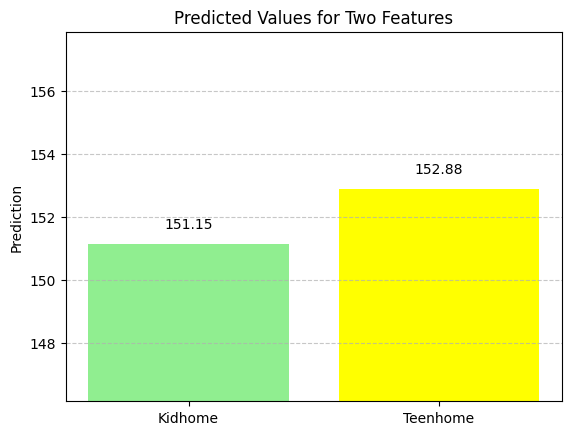

In [ ]:
values = predictions_6_1
labels = ['Kidhome', 'Teenhome']

plt.bar(labels, values, color=['lightgreen', 'yellow'])
plt.title('Predicted Values for Two Features')
plt.ylabel('Prediction')
plt.ylim(min(values) - 5, max(values) + 5)
plt.grid(axis='y', linestyle='--', alpha=0.7)

for i, v in enumerate(values):
    plt.text(i, v + 0.5, f'{v:.2f}', ha='center')

plt.show()

The bar chart "Predicted Values for Two Features" displays two predictions: one for "Kidhome" with a predicted value of 151.15 (light green bar) and another for "Teenhome" with a predicted value of 152.88 (yellow bar).

### 10.7 Hypothesis 7: Recency shapes customer purchasing behaviors

In [ ]:
test_data = pd.DataFrame({
  'Income': [55000 , 55000],
  'Kidhome': [0, 0],
  'Teenhome': [0, 0],
  'Recency': [24, 74],
  'NumDealsPurchases': [0, 0],
  'NumWebPurchases': [4, 4],
  'NumCatalogPurchases': [0, 0],
  'NumStorePurchases': [4, 4],
  'NumWebVisitsMonth': [0, 0],
  'Response': [0, 0],
  'Age': [43, 43],
  'Customer_Days': [2515, 2515],
  'AcceptedCmp3': [0, 0],
  'AcceptedCmp4': [0, 0],
  'AcceptedCmp5': [0, 0],
  'AcceptedCmp1': [0, 0],
  'AcceptedCmp2': [0, 0]
})

predictions_7 = rf_model.predict(test_data)

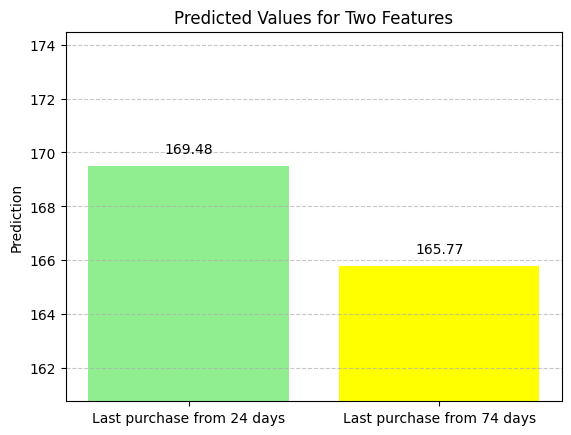

In [ ]:
values = predictions_7
labels = ['Last purchase from 24 days', 'Last purchase from 74 days']

plt.bar(labels, values, color=['lightgreen', 'yellow'])
plt.title('Predicted Values for Two Features')
plt.ylabel('Prediction')
plt.ylim(min(values) - 5, max(values) + 5)
plt.grid(axis='y', linestyle='--', alpha=0.7)

for i, v in enumerate(values):
    plt.text(i, v + 0.5, f'{v:.2f}', ha='center')

plt.show()

The bar chart titled "Predicted Values for Two Features" shows that the predicted value for "Last purchase from 24 days" is 169.48, which is higher than the predicted value of 165.77 for "Last purchase from 74 days."

### 10.8 Hypothesis 8: People visiting company website in last month, tends to pay less the following month

In [ ]:
test_data = pd.DataFrame({
  'Income': [57000 , 57000],
  'Kidhome': [0, 0],
  'Teenhome': [0, 0],
  'Recency': [49, 49],
  'NumDealsPurchases': [0, 0],
  'NumWebPurchases': [4, 4],
  'NumCatalogPurchases': [0, 0],
  'NumStorePurchases': [4, 4],
  'NumWebVisitsMonth': [0, 20],
  'Response': [0, 0],
  'Age': [30, 30],
  'Customer_Days': [2340, 2340],
  'AcceptedCmp3': [0, 0],
  'AcceptedCmp4': [0, 0],
  'AcceptedCmp5': [0, 0],
  'AcceptedCmp1': [0, 0],
  'AcceptedCmp2': [0, 0]
})

predictions_8 = rf_model.predict(test_data)

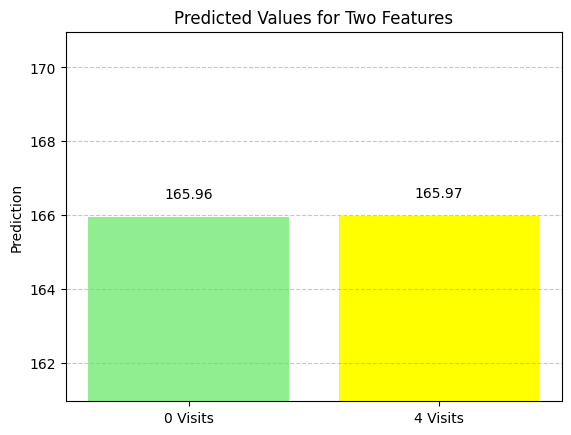

In [ ]:
values = predictions_8
labels = ['0 Visits', '4 Visits']

plt.bar(labels, values, color=['lightgreen', 'yellow'])
plt.title('Predicted Values for Two Features')
plt.ylabel('Prediction')
plt.ylim(min(values) - 5, max(values) + 5)
plt.grid(axis='y', linestyle='--', alpha=0.7)

for i, v in enumerate(values):
    plt.text(i, v + 0.5, f'{v:.2f}', ha='center')

plt.show()

## **10. Summary**

Based on prominent hypothesis, I summarize some insights and strategies which can help the business thrive in the profits and increase the cart value:

**A) Income:**

The feature has a high credibility with the 1st rank in the importance score (0.39) and high correlation of 0.82

- Develop special offers and deluxe services for higher-income customers such as introducing tier like gold, platinum,  free-shipping bonus or
- Conduct research on this customer segmentation to find out their preferences
- Deliver a more targeted and specific campaign for the strong financial power customers.

=> It will help increase around 9% profits for attracting customer has more 10,000 income than the last record

**B) Business catalogue:**

The feature has a high credibility with the 2nd rank in the importance score (0.37) and a correlation of 0.79

- Research on what features of catalogue that captivate the target customer.
- Find partners and generate more exclusive offers appear on business catalogue
- Expand content and media channel approaches of catalogue to test the effectiveness and enhance its quality.

=> The profit will be boosted up to 20% profits by customer who has used the catalogue 1 times, compared to the customer with none.

**C) Store vs Web:**

With the 2 customers have the same characteristics, and don't use any offers from the campaign 5. Person who makes the transaction on the web, have spent more money (170.07) than store goer with (162.2)

Recommendations case 1:

- Consider to hire a tech savvy expert to analyze patterns and behaviors of customers for more insights.
- Optimize app and deliver a seamless experience for website users
- Leverage the usage of technologies to provide more unique and personalized

=> The profit will surge up to 12% increase of value by customer who shopping online

Recommendations case 2:

- esearch on what factors or content from campaign 5 that attracts a lot of customers to the store
- Reuse the strategy from the campaign 5 and upgrade physical store shopping experience

=> If implement the strategy, we can rise the value of customer’s cart to 91%!

**D) Marketing Campaign 5:**

The campaign 5 rank 6th in the importance score and a 0.47 score for the correlation

- Make a survey or study consumer’s behavior case study from campaign 5

- Use the catalogue or social media to promote next similar campaign to a broader audience with similar interest from business existent customers
- Consider to spend more budget or seek for more partnership with famous brand to get exclusive deals and discounts for the next campaign

=> If the business can prepare well based on the data-backed proposal above, the profit can exceed more than 70% compared to other campaigns

**Conclusion ✅**

With the income segmentation, catalogue engagement, and next Campaign optimization, the business can achieve the profit as high as the previous campaign 5 or even higher thanks to other considered factors found in the analysis.

The outcome can be seen to surpass more than 90% compared to previous campaign from 4 or earlier.


## **11. Load data to csv file 🖥️**

In [ ]:
# Define the output file path
output_path = 'ifood_df_data_processed.csv'

# Write the DataFrame to a CSV file
df.to_csv(output_path, index=False)

print(f"DataFrame saved to {output_path}")

DataFrame saved to ifood_df_data_processed.csv
